In [2]:
# instalar dependências
#!pip install dbfread
#!pip install geopandas

In [3]:
from pathlib import Path
import pandas as pd
from dbfread import DBF
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl

In [4]:
def normalize_datasus_date_ddmmyyyy(df, date_col: str,
                                   new_date_col: str | None = None,
                                   new_year_col: str | None = None) -> pd.DataFrame:
    """
    Normaliza datas do DATASUS no formato DDMMYYYY (8 dígitos).
    - Remove lixo (ex.: '23032021.0') extraindo exatamente 8 dígitos.
    - Retorna colunas *_DT (datetime) e *_ANO (Int64).
    """
    if new_date_col is None:
        new_date_col = f"{date_col}_DT"
    if new_year_col is None:
        new_year_col = f"{date_col}_ANO"

    df = df.copy()
    s = (
        df[date_col].astype(str).str.strip()
        .str.extract(r"(\d{8})", expand=False)
    )
    df[new_date_col] = pd.to_datetime(s, format="%d%m%Y", errors="coerce")
    df[new_year_col] = df[new_date_col].dt.year.astype("Int64")
    return df


In [5]:
# ajuste de caminhos

IN_COLAB = False
try:
    from google.colab import drive
    IN_COLAB = True
except Exception:
    IN_COLAB = False

if IN_COLAB:
    drive.mount('/content/drive')
    DATA_DIR = Path('/content/drive/MyDrive/Projeto MM/data')
else:
    DATA_DIR = Path(r'C:\Users\Avell\Desktop\Projeto\data')

CSV_DIR_CNES = DATA_DIR / 'raw' / 'CNES'
DIR_IBGE = DATA_DIR / 'raw' / 'IBGE'
AUX_DIR = DATA_DIR / 'auxiliary'
OUT_DIR = DATA_DIR / 'processed'
GEO_DIR = DATA_DIR / 'geo'

MUN2RS_FILE = AUX_DIR / 'municipalities_health_regions_pr.xlsx'
RS_FILE = AUX_DIR / 'health_regions_pr.xlsx'

CSV_DIR_CNES, MUN2RS_FILE

Mounted at /content/drive


(PosixPath('/content/drive/MyDrive/Projeto MM/data/raw/CNES'),
 PosixPath('/content/drive/MyDrive/Projeto MM/data/auxiliary/municipalities_health_regions_pr.xlsx'))

In [6]:
# mapeamento Município -> Regional

mun2rs = pd.read_excel(MUN2RS_FILE)
mun2rs.columns = [c.strip() for c in mun2rs.columns]

rs = pd.read_excel(RS_FILE)
rs.columns = [c.strip() for c in rs.columns]

# padroniza código para string de 6 dígitos
mun2rs['CODMUN_IBGE6'] = mun2rs['Codigo'].astype(str).str.extract(r'(\d+)', expand=False).fillna('').str.zfill(6)
mun2rs['REGIONAL_SAUDE'] = mun2rs['Regional de Saude'].astype(int)

mun2rs[['REGIONAL_SAUDE','Municipio','CODMUN_IBGE6']].head()

,REGIONAL_SAUDE,Municipio,CODMUN_IBGE6
0,18,Abatiá,410010
1,2,Adrianópolis,410020
2,2,Agudos do Sul,410030
3,2,Almirante Tamandaré,410040
4,11,Altamira do Paraná,410045


In [7]:
def esf_media_anual_por_municipio(ep_ano):
    df = ep_ano.copy()

    # padroniza município (6 dígitos)
    df["CODMUN_IBGE6"] = (
        df["CODUFMUN"]
        .astype(str)
        .str.extract(r"(\d+)")[0]
        .str.zfill(6)
    )

    # ESF = TIPO_EQP 70
    df = df[df["TIPO_EQP"].astype(str) == "70"].copy()

    # garante COMPETEN como string
    df["COMPETEN"] = df["COMPETEN"].astype(str)

    # conta equipes únicas por município e mês
    mensal = (
        df
        .groupby(["CODMUN_IBGE6", "COMPETEN"])["IDEQUIPE"]
        .nunique()
        .reset_index(name="EQP_MES")
    )

    # média anual (12 meses)
    anual = (
        mensal
        .groupby("CODMUN_IBGE6", as_index=False)["EQP_MES"]
        .mean()
        .rename(columns={"EQP_MES": "NUM_EQUIPES_ESF"})
    )

    return anual

In [8]:
ep21 = pd.read_csv(CSV_DIR_CNES / "EPPR21.csv")
ep22 = pd.read_csv(CSV_DIR_CNES / "EPPR22.csv")
ep23 = pd.read_csv(CSV_DIR_CNES / "EPPR23.csv")
ep24 = pd.read_csv(CSV_DIR_CNES / "EPPR24.csv")

esf21 = esf_media_anual_por_municipio(ep21)
esf22 = esf_media_anual_por_municipio(ep22)
esf23 = esf_media_anual_por_municipio(ep23)
esf24 = esf_media_anual_por_municipio(ep24)

/tmp/ipython-input-3879277384.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  ep22 = pd.read_csv(CSV_DIR_CNES / "EPPR22.csv")
/tmp/ipython-input-3879277384.py:3: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  ep23 = pd.read_csv(CSV_DIR_CNES / "EPPR23.csv")
/tmp/ipython-input-3879277384.py:4: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  ep24 = pd.read_csv(CSV_DIR_CNES / "EPPR24.csv")


In [9]:
esf_2021_2024 = (
    pd.concat([esf21, esf22, esf23, esf24])
    .groupby("CODMUN_IBGE6", as_index=False)["NUM_EQUIPES_ESF"]
    .mean()
)
esf_2021_2024

,CODMUN_IBGE6,NUM_EQUIPES_ESF
0,410010,2.000000
1,410020,2.979167
2,410030,4.000000
3,410040,12.979167
4,410045,2.000000
...,...,...
394,412862,1.000000
395,412863,2.000000
396,412865,2.000000
397,412870,2.854167


In [10]:
resultado = esf_2021_2024[esf_2021_2024["CODMUN_IBGE6"].isin(["410690", "411370"])]
print(resultado)

    CODMUN_IBGE6  NUM_EQUIPES_ESF
93        410690       197.041667
190       411370        96.520833


In [11]:
def ler_dbf(caminho):
    return pd.DataFrame(iter(DBF(caminho, load=True, char_decode_errors="ignore")))

In [12]:
pop21 = ler_dbf(DIR_IBGE / "POPTBR21.dbf")
pop22 = ler_dbf(DIR_IBGE / "POPTPR22.dbf")
pop23 = ler_dbf(DIR_IBGE / "POPTPR23.dbf")
pop24 = ler_dbf(DIR_IBGE / "POPTBR24.dbf")

In [13]:
def padroniza_municipio(df, col="MUNIC_RES", out_col="CODMUN_IBGE6"):
    s = df[col].astype(str).str.extract(r"(\d+)")[0]

    s = s.where(s.isna(), s.str.strip())
    s = s.where(s.isna(), s.str[:-1].where(s.str.len() == 7, s))

    df[out_col] = s.str.zfill(6)

    return df

In [14]:
pop21 = padroniza_municipio(pop21)
pop22 = padroniza_municipio(pop22)
pop23 = padroniza_municipio(pop23)
pop24 = padroniza_municipio(pop24)

pop21 = pop21.drop('MUNIC_RES', axis=1)
pop22 = pop22.drop('MUNIC_RES', axis=1)
pop23 = pop23.drop('MUNIC_RES', axis=1)
pop24 = pop24.drop('MUNIC_RES', axis=1)

In [15]:
pop21

,ANO,POPULACAO,CODMUN_IBGE6
0,2021,22516,110001
1,2021,111148,110002
2,2021,5067,110003
3,2021,86416,110004
4,2021,16088,110005
...,...,...,...
5565,2021,14088,522200
5566,2021,9002,522205
5567,2021,6451,522220
5568,2021,5941,522230


In [16]:
def filtra_parana(df):
    return df[df["CODMUN_IBGE6"].str.startswith("41")].copy()

In [17]:
pop21 = filtra_parana(pop21)
pop24 = filtra_parana(pop24)

In [18]:
pop21.columns

Index(['ANO', 'POPULACAO', 'CODMUN_IBGE6'], dtype='object')

In [19]:
def seleciona_pop(df, ano):
    return (
        df[["CODMUN_IBGE6", "POPULACAO"]]
        .rename(columns={"POPULACAO": f"POP_{ano}"})
    )

In [20]:
p21 = seleciona_pop(pop21, 2021)
p22 = seleciona_pop(pop22, 2022)
p23 = seleciona_pop(pop23, 2023)
p24 = seleciona_pop(pop24, 2024)

In [21]:
df_pop = (
    p21
    .merge(p22, on="CODMUN_IBGE6")
    .merge(p23, on="CODMUN_IBGE6")
    .merge(p24, on="CODMUN_IBGE6")
)

In [22]:
df_pop["POP_TOTAL"] = df_pop[
    ["POP_2021", "POP_2022", "POP_2023", "POP_2024"]
].mean(axis=1)

In [23]:
df_pop

,CODMUN_IBGE6,POP_2021,POP_2022,POP_2023,POP_2024,POP_TOTAL
0,410010,7360,7241,7241,7271,7278.25
1,410020,5797,6256,6256,6327,6159.00
2,410030,9567,10233,10233,10646,10169.75
3,410040,121420,119825,119825,124788,121464.50
4,410045,1429,3590,3590,3543,3038.00
...,...,...,...,...,...,...
394,412862,2630,3055,3055,3077,2954.25
395,412863,5525,5697,5697,5773,5673.00
396,412865,4051,3811,3811,3842,3878.75
397,412870,6879,9706,9706,10280,9142.75


In [24]:
resultado = df_pop[df_pop["CODMUN_IBGE6"].isin(["410690", "411370"])]
print(resultado)

    CODMUN_IBGE6  POP_2021  POP_2022  POP_2023  POP_2024   POP_TOTAL
93        410690   1963726   1773718   1773718   1829225  1835096.75
190       411370    580870    555965    555965    577318   567529.50


In [25]:
df_esf = df_pop.merge(esf_2021_2024, on="CODMUN_IBGE6", how="left")
df_esf

,CODMUN_IBGE6,POP_2021,POP_2022,POP_2023,POP_2024,POP_TOTAL,NUM_EQUIPES_ESF
0,410010,7360,7241,7241,7271,7278.25,2.000000
1,410020,5797,6256,6256,6327,6159.00,2.979167
2,410030,9567,10233,10233,10646,10169.75,4.000000
3,410040,121420,119825,119825,124788,121464.50,12.979167
4,410045,1429,3590,3590,3543,3038.00,2.000000
...,...,...,...,...,...,...,...
394,412862,2630,3055,3055,3077,2954.25,1.000000
395,412863,5525,5697,5697,5773,5673.00,2.000000
396,412865,4051,3811,3811,3842,3878.75,2.000000
397,412870,6879,9706,9706,10280,9142.75,2.854167


In [26]:
resultado = df_esf[df_esf["CODMUN_IBGE6"].isin(["410690", "411370"])]
print(resultado)

    CODMUN_IBGE6  POP_2021  POP_2022  POP_2023  POP_2024   POP_TOTAL  \
93        410690   1963726   1773718   1773718   1829225  1835096.75   
190       411370    580870    555965    555965    577318   567529.50   

     NUM_EQUIPES_ESF  
93        197.041667  
190        96.520833  


In [27]:
df_esf["POP_COBERTA"] = df_esf["NUM_EQUIPES_ESF"] * 3450
df_esf["POP_COBERTA"] = df_esf[["POP_COBERTA", "POP_TOTAL"]].min(axis=1)

df_esf["COBERTURA_ESF"] = (df_esf["POP_COBERTA"] / df_esf["POP_TOTAL"]) * 100

In [28]:
df_esf = df_esf.merge(
    mun2rs,
    on="CODMUN_IBGE6",
    how="left"
)
df_esf

,CODMUN_IBGE6,POP_2021,POP_2022,POP_2023,POP_2024,POP_TOTAL,NUM_EQUIPES_ESF,POP_COBERTA,COBERTURA_ESF,Regional de Saude,Municipio,Codigo,REGIONAL_SAUDE
0,410010,7360,7241,7241,7271,7278.25,2.000000,6900.000,94.803009,18,Abatiá,410010,18
1,410020,5797,6256,6256,6327,6159.00,2.979167,6159.000,100.000000,2,Adrianópolis,410020,2
2,410030,9567,10233,10233,10646,10169.75,4.000000,10169.750,100.000000,2,Agudos do Sul,410030,2
3,410040,121420,119825,119825,124788,121464.50,12.979167,44778.125,36.865195,2,Almirante Tamandaré,410040,2
4,410045,1429,3590,3590,3543,3038.00,2.000000,3038.000,100.000000,11,Altamira do Paraná,410045,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...
394,412862,2630,3055,3055,3077,2954.25,1.000000,2954.250,100.000000,12,Alto Paraíso,412862,12
395,412863,5525,5697,5697,5773,5673.00,2.000000,5673.000,100.000000,2,Doutor Ulysses,412863,2
396,412865,4051,3811,3811,3842,3878.75,2.000000,3878.750,100.000000,5,Virmond,412865,5
397,412870,6879,9706,9706,10280,9142.75,2.854167,9142.750,100.000000,7,Vitorino,412870,7


In [29]:
cobertura_esf_rs = (
    df_esf
    .groupby("REGIONAL_SAUDE")
    .apply(lambda d: (d["POP_COBERTA"].sum() / d["POP_TOTAL"].sum()) * 100)
    .reset_index()
    .rename(columns={0: "COBERTURA_ESF"})
)
cobertura_esf_rs

/tmp/ipython-input-116984735.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: (d["POP_COBERTA"].sum() / d["POP_TOTAL"].sum()) * 100)


,REGIONAL_SAUDE,COBERTURA_ESF
0,1,83.290885
1,2,53.739399
2,3,77.977438
3,4,82.962610
4,5,84.772205
5,6,88.695322
6,7,90.474536
7,8,94.182254
8,9,90.277011
9,10,73.653462


In [30]:
cobertura_esf_rs["COBERTURA_ESF"] = cobertura_esf_rs["COBERTURA_ESF"].round(2)
cobertura_esf_rs

,REGIONAL_SAUDE,COBERTURA_ESF
0,1,83.29
1,2,53.74
2,3,77.98
3,4,82.96
4,5,84.77
5,6,88.70
6,7,90.47
7,8,94.18
8,9,90.28
9,10,73.65


In [31]:
# carregar o shapefile
df_mapa = gpd.read_file(GEO_DIR / 'Limites_Municipais_2020.shp')

In [32]:
df_mapa["CODMUN_IBGE6"] = (
    df_mapa["codibge"]
    .astype(str)
    .str.slice(0, 6)
)
df_mapa

,gid,codibge,nome,geometry,CODMUN_IBGE6
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620
...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980


In [33]:
df_mapa1 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa1

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [34]:
df_mapa_rs1 = (
    df_mapa1
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

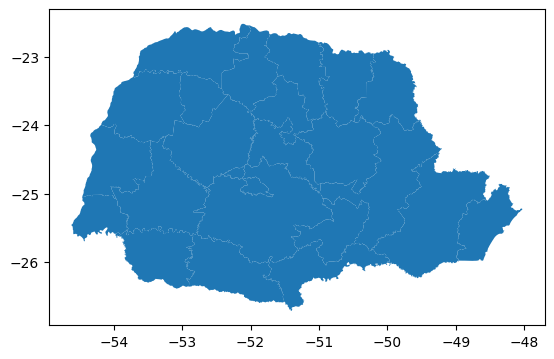

In [35]:
# exibir o mapa
df_mapa_rs1.plot()

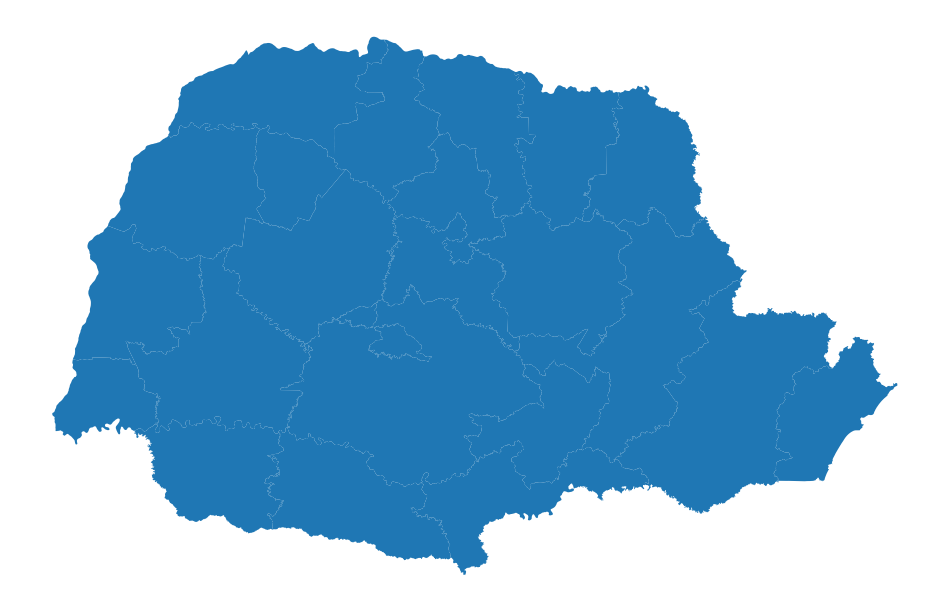

In [36]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs1.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [37]:
df_mapa_rs1 = df_mapa_rs1.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [38]:
df_mapa_rs1 = df_mapa_rs1.merge(
    cobertura_esf_rs[["REGIONAL_SAUDE", "COBERTURA_ESF"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,COBERTURA_ESF
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,83.29
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,53.74
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,77.98
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,82.96
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,84.77
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,88.70
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,90.47
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,94.18
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,90.28
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,73.65


In [39]:
# obter as coordenadas dos polígonos
df_mapa_rs1['coords'] = df_mapa_rs1['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs1['coords'] = [coords[0] for coords in df_mapa_rs1['coords']]

df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,COBERTURA_ESF,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,83.29,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,53.74,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,77.98,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,82.96,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,84.77,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,88.70,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,90.47,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,94.18,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,90.28,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,73.65,"(-53.16386155649289, -24.887229705566053)"


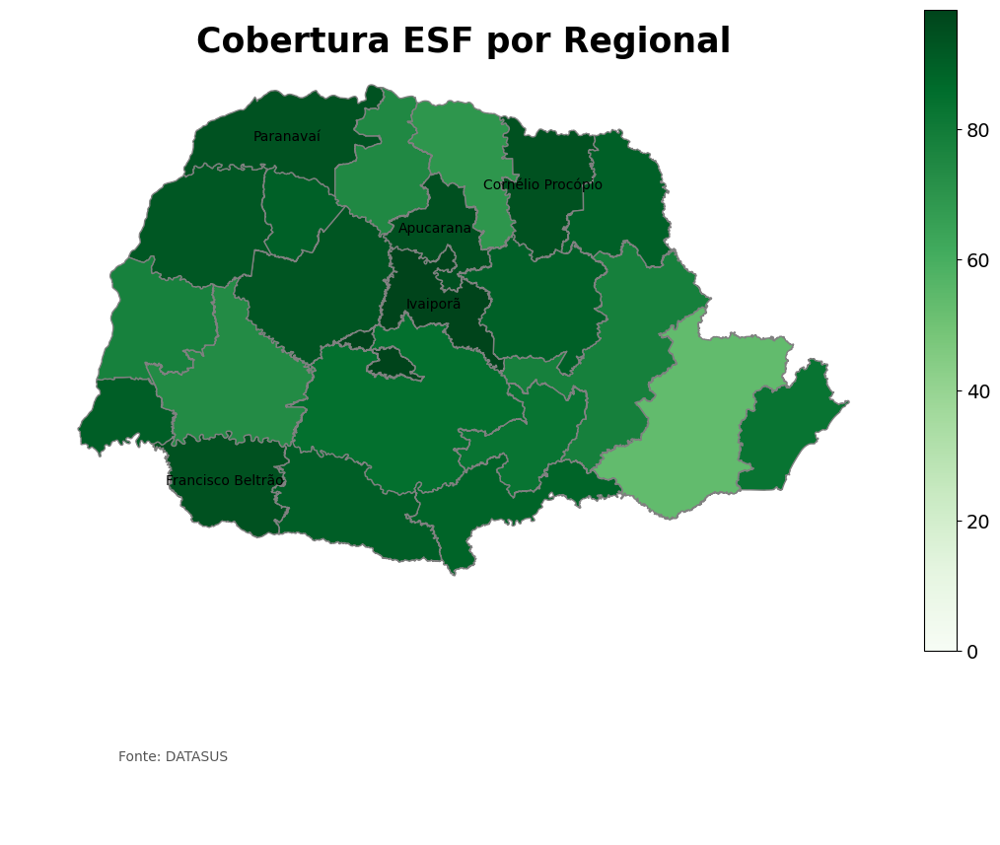

In [40]:
# desenhar o mapa

color = 'Greens'
vmin, vmax = 0, df_mapa_rs1["COBERTURA_ESF"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs1.plot(
    column='COBERTURA_ESF',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'Cobertura ESF por Regional',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs1["COBERTURA_ESF"].nlargest(5).min()

for _, row in df_mapa_rs1.iterrows():
    if row["COBERTURA_ESF"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()
# Resultado: qual a proporção da população coberta por equipes da ESF,
#            expressa em percentual (%).

In [41]:
def leitos_obst_media_anual_por_municipio(lt_ano):
    df = lt_ano.copy()

    df["CODMUN_IBGE6"] = (
        df["CODUFMUN"]
        .astype(str)
        .str.extract(r"(\d+)")[0]
        .str.zfill(6)
    )

    df["CODLEITO"] = (
        df["CODLEITO"]
        .astype(str)
        .str.extract(r"(\d+)")[0]
        .str.zfill(2)
    )

    df["TP_LEITO"] = df["TP_LEITO"].astype(str).str.strip()
    df["COMPETEN"] = df["COMPETEN"].astype(str).str.strip()

    # filtro correto
    df = df[
        (df["TP_LEITO"] == "4") &
        (df["CODLEITO"].isin(["09", "10"]))
    ].copy()

    df["QT_SUS"] = pd.to_numeric(df["QT_SUS"], errors="coerce").fillna(0)

    mensal = (
        df.groupby(["CODMUN_IBGE6", "COMPETEN"])["QT_SUS"]
          .sum()
          .reset_index(name="LEITOS_OBS_MES")
    )

    anual = (
        mensal.groupby("CODMUN_IBGE6", as_index=False)["LEITOS_OBS_MES"]
              .mean()
              .rename(columns={"LEITOS_OBS_MES": "LEITOS_OBS"})
    )

    return anual

In [42]:
lt21 = pd.read_csv(CSV_DIR_CNES / "LTPR21.csv")
lt22 = pd.read_csv(CSV_DIR_CNES / "LTPR22.csv")
lt23 = pd.read_csv(CSV_DIR_CNES / "LTPR23.csv")
lt24 = pd.read_csv(CSV_DIR_CNES / "LTPR24.csv")

leitos21 = leitos_obst_media_anual_por_municipio(lt21)
leitos22 = leitos_obst_media_anual_por_municipio(lt22)
leitos23 = leitos_obst_media_anual_por_municipio(lt23)
leitos24 = leitos_obst_media_anual_por_municipio(lt24)

In [43]:
leitos_2021_2024 = (
    pd.concat([leitos21, leitos22, leitos23, leitos24])
    .groupby("CODMUN_IBGE6", as_index=False)["LEITOS_OBS"]
    .mean()
)
leitos_2021_2024

,CODMUN_IBGE6,LEITOS_OBS
0,410045,2.0
1,410050,5.0
2,410100,4.0
3,410110,3.0
4,410120,2.0
...,...,...
150,412800,2.0
151,412810,15.0
152,412820,5.0
153,412840,3.0


In [44]:
df_leitos = df_pop.merge(leitos_2021_2024, on="CODMUN_IBGE6", how="left")

df_leitos["LEITOS_OBS"] = df_leitos["LEITOS_OBS"].fillna(0)

df_leitos = df_leitos.merge(
    mun2rs,
    on="CODMUN_IBGE6",
    how="left"
)

df_leitos

,CODMUN_IBGE6,POP_2021,POP_2022,POP_2023,POP_2024,POP_TOTAL,LEITOS_OBS,Regional de Saude,Municipio,Codigo,REGIONAL_SAUDE
0,410010,7360,7241,7241,7271,7278.25,0.0,18,Abatiá,410010,18
1,410020,5797,6256,6256,6327,6159.00,0.0,2,Adrianópolis,410020,2
2,410030,9567,10233,10233,10646,10169.75,0.0,2,Agudos do Sul,410030,2
3,410040,121420,119825,119825,124788,121464.50,0.0,2,Almirante Tamandaré,410040,2
4,410045,1429,3590,3590,3543,3038.00,2.0,11,Altamira do Paraná,410045,11
...,...,...,...,...,...,...,...,...,...,...,...
394,412862,2630,3055,3055,3077,2954.25,0.0,12,Alto Paraíso,412862,12
395,412863,5525,5697,5697,5773,5673.00,0.0,2,Doutor Ulysses,412863,2
396,412865,4051,3811,3811,3842,3878.75,0.0,5,Virmond,412865,5
397,412870,6879,9706,9706,10280,9142.75,0.0,7,Vitorino,412870,7


In [45]:
leitos_rs = (
    df_leitos
    .groupby("REGIONAL_SAUDE", as_index=False)
    .agg(
        LEITOS_OBS=("LEITOS_OBS", "sum"),
        POP_TOTAL=("POP_TOTAL", "sum")
    )
)

leitos_rs["LEITOS_OBS_10MIL"] = (leitos_rs["LEITOS_OBS"] / leitos_rs["POP_TOTAL"]) * 10000
leitos_rs["LEITOS_OBS_10MIL"] = leitos_rs["LEITOS_OBS_10MIL"].round(2)

leitos_rs

,REGIONAL_SAUDE,LEITOS_OBS,POP_TOTAL,LEITOS_OBS_10MIL
0,1,32.187500,304485.75,1.06
1,2,239.958333,3637553.25,0.66
2,3,62.210227,643898.75,0.97
3,4,38.000000,168465.50,2.26
4,5,65.937500,455892.50,1.45
5,6,8.000000,167319.00,0.48
6,7,33.062500,279588.75,1.18
7,8,45.895833,380559.75,1.21
8,9,34.395833,438113.75,0.79
9,10,60.533333,577151.25,1.05


In [46]:
df_mapa2 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa2

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [47]:
df_mapa_rs2 = (
    df_mapa2
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

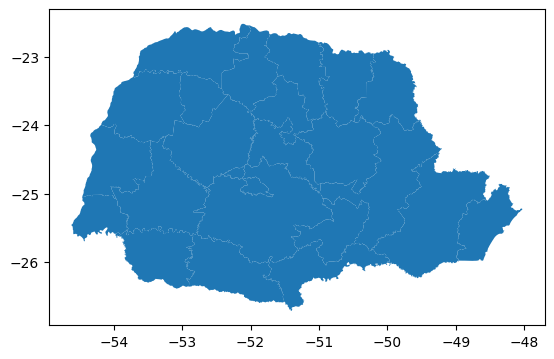

In [48]:
# exibir o mapa
df_mapa_rs2.plot()

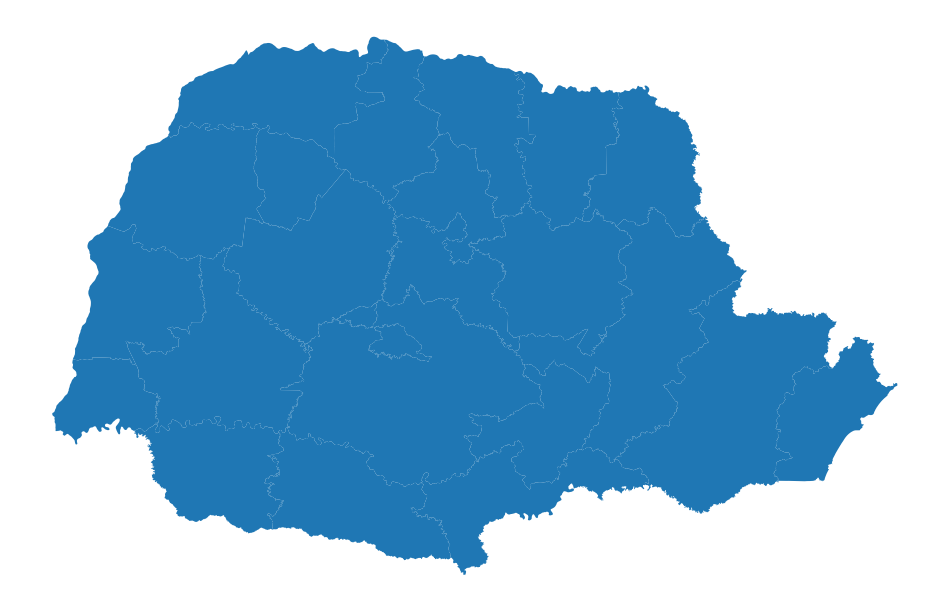

In [49]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs2.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [50]:
df_mapa_rs2 = df_mapa_rs2.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [51]:
df_mapa_rs2 = df_mapa_rs2.merge(
    leitos_rs[["REGIONAL_SAUDE", "LEITOS_OBS_10MIL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,LEITOS_OBS_10MIL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,1.06
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,0.66
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,0.97
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,2.26
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,1.45
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,0.48
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,1.18
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,1.21
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,0.79
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,1.05


In [52]:
# obter as coordenadas dos polígonos
df_mapa_rs2['coords'] = df_mapa_rs2['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs2['coords'] = [coords[0] for coords in df_mapa_rs2['coords']]

df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,LEITOS_OBS_10MIL,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,1.06,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,0.66,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,0.97,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,2.26,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,1.45,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,0.48,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,1.18,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,1.21,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,0.79,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,1.05,"(-53.16386155649289, -24.887229705566053)"


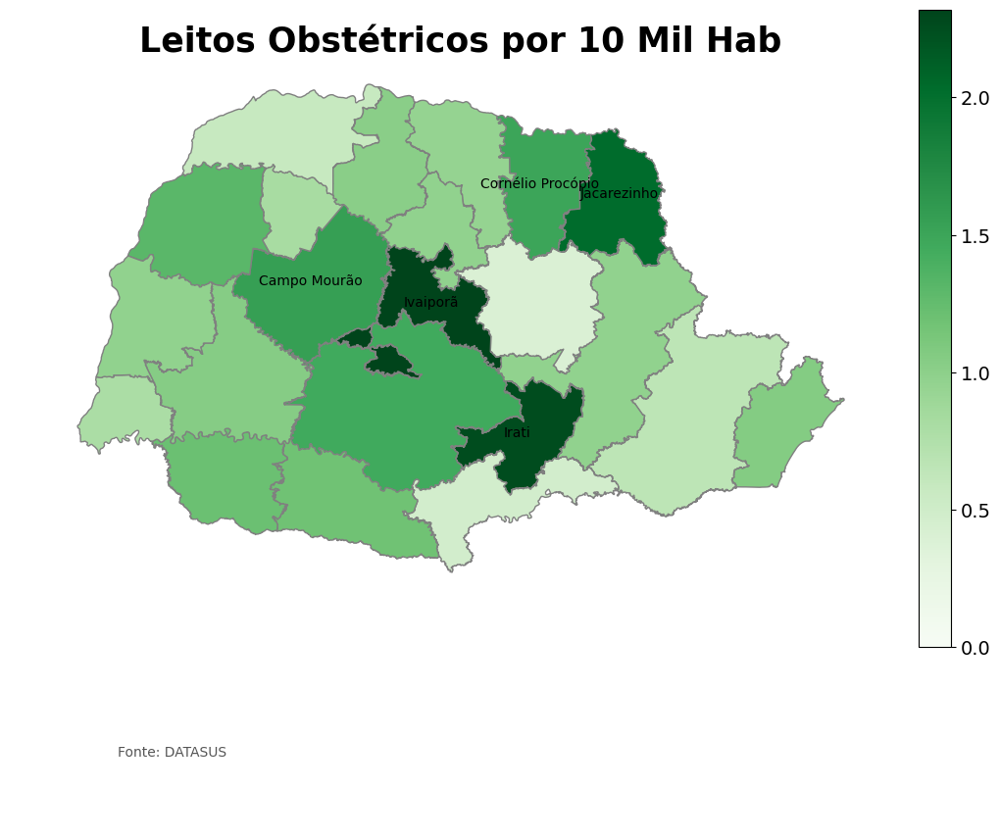

In [53]:
# desenhar o mapa

color = 'Greens'
vmin, vmax = 0, df_mapa_rs2["LEITOS_OBS_10MIL"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs2.plot(
    column='LEITOS_OBS_10MIL',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'Leitos Obstétricos por 10 Mil Hab',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs2["LEITOS_OBS_10MIL"].nlargest(5).min()

for _, row in df_mapa_rs2.iterrows():
    if row["LEITOS_OBS_10MIL"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()
# Resultado: quantos leitos obstétricos do SUS existem, em média,
#            para cada 10.000 habitantes, na regional.

In [54]:
def profissionais_obstetricos_media_anual_por_municipio(pf_ano):
    df = pf_ano.copy()

    df["CODMUN_IBGE6"] = (
        df["CODUFMUN"].astype(str)
        .str.extract(r"(\d+)")[0]
        .str.slice(0, 6)
        .str.zfill(6)
    )

    df["COMPETEN"] = df["COMPETEN"].astype(str).str.strip()

    # CBO (6 dígitos) + filtro específico (regex)
    df["CBO"] = (
        df["CBO"].astype(str).str.strip()
        .str.extract(r"(\d{6})", expand=False)
    )
    df = df.dropna(subset=["CBO"]).copy()

    # códigos exatos (6 dígitos)
    cbo_exatos = {"225250", "225125", "225133", "223547", "223505", "322205", "322230"}
    mask_exatos = df["CBO"].isin(cbo_exatos)

    # grupos por prefixo (ainda 6 dígitos): 2232xx (odonto) e 2515xx (psicólogos)
    mask_prefixos = df["CBO"].str.match(r"^(2232|2515)\d{2}$")

    mask_prof = mask_exatos | mask_prefixos
    df = df[mask_prof].copy()

    mensal = (
        df.groupby(["CODMUN_IBGE6", "COMPETEN"])
          .size()
          .reset_index(name="PROF_MES")
    )

    anual = (
        mensal.groupby("CODMUN_IBGE6", as_index=False)["PROF_MES"]
              .mean()
              .rename(columns={"PROF_MES": "PROF_OBSTETRICOS"})
    )

    return anual

In [55]:
pf21 = pd.read_csv(CSV_DIR_CNES / "PFPR21.csv")
pf22 = pd.read_csv(CSV_DIR_CNES / "PFPR22.csv")
pf23 = pd.read_csv(CSV_DIR_CNES / "PFPR23.csv")
pf24 = pd.read_csv(CSV_DIR_CNES / "PFPR24.csv")

profissionais21 = profissionais_obstetricos_media_anual_por_municipio(pf21)
profissionais22 = profissionais_obstetricos_media_anual_por_municipio(pf22)
profissionais23 = profissionais_obstetricos_media_anual_por_municipio(pf23)
profissionais24 = profissionais_obstetricos_media_anual_por_municipio(pf24)

/tmp/ipython-input-1389302616.py:1: DtypeWarning: Columns (2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  pf21 = pd.read_csv(CSV_DIR_CNES / "PFPR21.csv")
/tmp/ipython-input-1389302616.py:2: DtypeWarning: Columns (2,3,4,5,23) have mixed types. Specify dtype option on import or set low_memory=False.
  pf22 = pd.read_csv(CSV_DIR_CNES / "PFPR22.csv")
/tmp/ipython-input-1389302616.py:3: DtypeWarning: Columns (2,3,4,5,22,23) have mixed types. Specify dtype option on import or set low_memory=False.
  pf23 = pd.read_csv(CSV_DIR_CNES / "PFPR23.csv")
/tmp/ipython-input-1389302616.py:4: DtypeWarning: Columns (2,4,22,23) have mixed types. Specify dtype option on import or set low_memory=False.
  pf24 = pd.read_csv(CSV_DIR_CNES / "PFPR24.csv")


In [56]:
profissionais_2021_2024 = (
    pd.concat([profissionais21, profissionais22, profissionais23, profissionais24])
    .groupby("CODMUN_IBGE6", as_index=False)["PROF_OBSTETRICOS"]
    .mean()
)
profissionais_2021_2024

,CODMUN_IBGE6,PROF_OBSTETRICOS
0,410010,19.812500
1,410020,33.729167
2,410030,50.000000
3,410040,318.187500
4,410045,30.375000
...,...,...
394,412862,26.375000
395,412863,23.312500
396,412865,12.500000
397,412870,27.291667


In [57]:
df_profissionais = df_pop.merge(profissionais_2021_2024, on="CODMUN_IBGE6", how="left")

df_profissionais["PROF_OBSTETRICOS"] = df_profissionais["PROF_OBSTETRICOS"].fillna(0)

df_profissionais = df_profissionais.merge(
    mun2rs,
    on="CODMUN_IBGE6",
    how="left"
)

df_profissionais

,CODMUN_IBGE6,POP_2021,POP_2022,POP_2023,POP_2024,POP_TOTAL,PROF_OBSTETRICOS,Regional de Saude,Municipio,Codigo,REGIONAL_SAUDE
0,410010,7360,7241,7241,7271,7278.25,19.812500,18,Abatiá,410010,18
1,410020,5797,6256,6256,6327,6159.00,33.729167,2,Adrianópolis,410020,2
2,410030,9567,10233,10233,10646,10169.75,50.000000,2,Agudos do Sul,410030,2
3,410040,121420,119825,119825,124788,121464.50,318.187500,2,Almirante Tamandaré,410040,2
4,410045,1429,3590,3590,3543,3038.00,30.375000,11,Altamira do Paraná,410045,11
...,...,...,...,...,...,...,...,...,...,...,...
394,412862,2630,3055,3055,3077,2954.25,26.375000,12,Alto Paraíso,412862,12
395,412863,5525,5697,5697,5773,5673.00,23.312500,2,Doutor Ulysses,412863,2
396,412865,4051,3811,3811,3842,3878.75,12.500000,5,Virmond,412865,5
397,412870,6879,9706,9706,10280,9142.75,27.291667,7,Vitorino,412870,7


In [58]:
profissionais_rs = (
    df_profissionais
    .groupby("REGIONAL_SAUDE", as_index=False)
    .agg(
        PROF_OBSTETRICOS=("PROF_OBSTETRICOS", "sum"),
        POP_TOTAL=("POP_TOTAL", "sum")
    )
)

profissionais_rs["PROFISSIONAIS_OBS_10MIL"] = (profissionais_rs["PROF_OBSTETRICOS"] / profissionais_rs["POP_TOTAL"]) * 10000
profissionais_rs["PROFISSIONAIS_OBS_10MIL"] = profissionais_rs["PROFISSIONAIS_OBS_10MIL"].round(2)

profissionais_rs

,REGIONAL_SAUDE,PROF_OBSTETRICOS,POP_TOTAL,PROFISSIONAIS_OBS_10MIL
0,1,1929.604167,304485.75,63.37
1,2,56163.145833,3637553.25,154.40
2,3,5566.416667,643898.75,86.45
3,4,1199.687500,168465.50,71.21
4,5,3459.687500,455892.50,75.89
5,6,1471.333333,167319.00,87.94
6,7,2833.333333,279588.75,101.34
7,8,3118.104167,380559.75,81.93
8,9,4840.166667,438113.75,110.48
9,10,7274.708333,577151.25,126.05


In [59]:
df_mapa3 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa3

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [60]:
df_mapa_rs3 = (
    df_mapa3
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

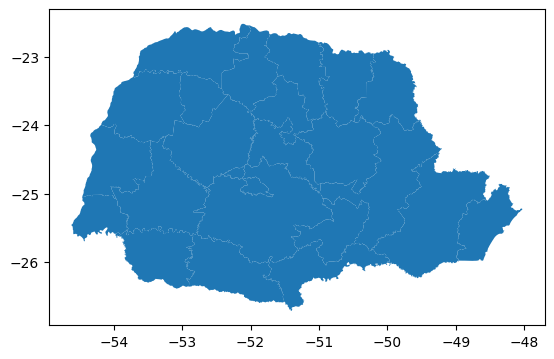

In [61]:
# exibir o mapa
df_mapa_rs3.plot()

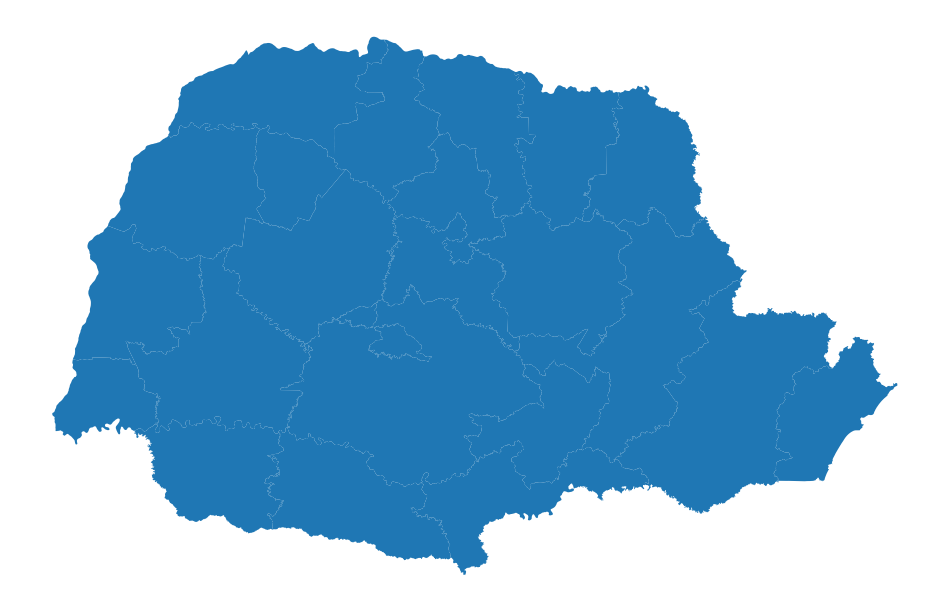

In [62]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs3.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [63]:
df_mapa_rs3 = df_mapa_rs3.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [64]:
df_mapa_rs3 = df_mapa_rs3.merge(
    profissionais_rs[["REGIONAL_SAUDE", "PROFISSIONAIS_OBS_10MIL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,PROFISSIONAIS_OBS_10MIL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,63.37
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,154.40
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,86.45
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,71.21
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,75.89
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,87.94
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,101.34
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,81.93
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,110.48
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,126.05


In [65]:
# obter as coordenadas dos polígonos
df_mapa_rs3['coords'] = df_mapa_rs3['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs3['coords'] = [coords[0] for coords in df_mapa_rs3['coords']]

df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,PROFISSIONAIS_OBS_10MIL,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,63.37,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,154.40,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,86.45,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,71.21,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,75.89,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,87.94,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,101.34,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,81.93,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,110.48,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,126.05,"(-53.16386155649289, -24.887229705566053)"


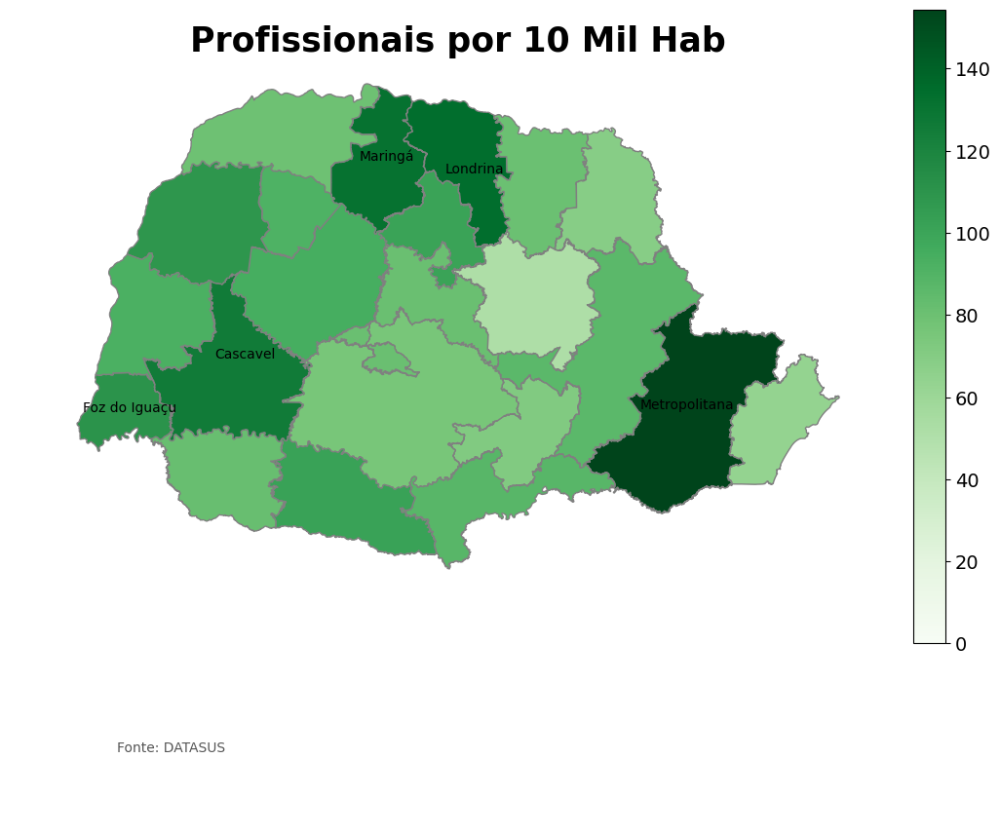

In [66]:
# desenhar o mapa

color = 'Greens'
vmin, vmax = 0, df_mapa_rs3["PROFISSIONAIS_OBS_10MIL"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs3.plot(
    column='PROFISSIONAIS_OBS_10MIL',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'Profissionais por 10 Mil Hab',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs3["PROFISSIONAIS_OBS_10MIL"].nlargest(5).min()

for _, row in df_mapa_rs3.iterrows():
    if row["PROFISSIONAIS_OBS_10MIL"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()
# Resultado: quantos profissionais estratégicos para a atenção materna existem, em média,
#            para cada 10.000 habitantes.